In [31]:
import numpy as np
import pandas as pd
import os
from PIL import Image
import matplotlib.pyplot as plt
import pickle

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity

from paths import (
    vision_emb_path,
    text_emb_path,
    projected_emb_path,
    projection_dir,
    unimodal_attributions_path,
    retrieval_attributions_path
)

CURRENT_DATASET = "Flickr8k"

In [32]:
VISION = "ResNet50"      # options: ResNet50, ViT, MobileNetV3, PVT
TEXT   = "BERT"          # options: BERT, RoBERTa, GPT2
METHOD = "WCCA"          # options: RP, WCCA, CPCA


In [33]:
df = pd.read_pickle(f"TFE_Data/Datasets/df_{CURRENT_DATASET}.pkl")

IMAGE_PATHS = df["image_path"].tolist()
image_to_captions = {
    row["image_name"]: row["captions"]
    for _, row in df.iterrows()
}

print("Loaded", len(IMAGE_PATHS), "image paths")


Loaded 8091 image paths


In [34]:
# Load unimodal attributions
with open(unimodal_attributions_path(CURRENT_DATASET), "rb") as f:
    attrs_unimodal = pickle.load(f)

# Load retrieval attributions
with open(retrieval_attributions_path(CURRENT_DATASET), "rb") as f:
    attrs_retrieval = pickle.load(f)

def get_model_attrs(model_name, mode="unimodal"):
    source = attrs_unimodal if mode == "unimodal" else attrs_retrieval
    return next(e for e in source if e["model"] == model_name)


In [35]:
vision_raw = {
    "ResNet50": np.load(vision_emb_path(CURRENT_DATASET, "ResNet50")),
    "ViT": np.load(vision_emb_path(CURRENT_DATASET, "ViT")),
    "MobileNetV3": np.load(vision_emb_path(CURRENT_DATASET, "MobileNetV3")),
    "PVT": np.load(vision_emb_path(CURRENT_DATASET, "PVT")),
}

text_raw = {
    "BERT": np.load(text_emb_path(CURRENT_DATASET, "BERT")),
    "RoBERTa": np.load(text_emb_path(CURRENT_DATASET, "RoBERTa")),
    "GPT2": np.load(text_emb_path(CURRENT_DATASET, "GPT2")),
}


In [36]:
Xv_proj = np.load(projected_emb_path(CURRENT_DATASET, VISION, TEXT, METHOD, "Xv"))
Xt_proj = np.load(projected_emb_path(CURRENT_DATASET, VISION, TEXT, METHOD, "Xt"))

print("Projected embeddings loaded:", Xv_proj.shape, Xt_proj.shape)


Projected embeddings loaded: (8091, 128) (40455, 128)


In [37]:
def cluster_embeddings(X, n_clusters=20):
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    labels = kmeans.fit_predict(X)
    return labels, kmeans

def best_k(X, k_list=[5,10,15,20,30]):
    scores = {}
    for k in k_list:
        labels = KMeans(n_clusters=k, random_state=0).fit_predict(X)
        scores[k] = silhouette_score(X, labels)
    return scores

def cluster_centroids(X, labels):
    centroids = []
    for c in np.unique(labels):
        centroids.append(X[labels == c].mean(axis=0))
    return np.vstack(centroids)


def show_cluster_attributions(cluster_id, labels, all_attrs, model_name, IMAGE_PATHS, max_images=5):
    entry = next(e for e in all_attrs if e["model"] == model_name)

    idxs = [i for i, c in enumerate(labels) if c == cluster_id][:max_images]

    for idx in idxs:
        print(f"\n=== Image {idx} ===")
        show_attributions_for_image(model_name, idx, all_attrs)


In [38]:
def show_cluster(cluster_id, labels, IMAGE_PATHS, max_images=20):
    idxs = [i for i, c in enumerate(labels) if c == cluster_id][:max_images]

    if len(idxs) == 0:
        print(f"No images in cluster {cluster_id}")
        return

    rows = (len(idxs) // 5) + 1
    fig, axes = plt.subplots(rows, 5, figsize=(15, 3*rows))
    axes = axes.flatten()

    for ax, idx in zip(axes, idxs):
        img = Image.open(IMAGE_PATHS[idx])
        ax.imshow(img)
        ax.set_title(f"Image {idx}")
        ax.axis("off")

    plt.suptitle(f"Cluster {cluster_id} — {len(idxs)} images")
    plt.show()


In [39]:
def show_cluster_neighbors(k, labels, Xv_proj, IMAGE_PATHS, df):
    centroids = cluster_centroids(Xv_proj, labels)
    dists = cosine_similarity(centroids)

    closest = np.argsort(-dists[k])[1:4]
    furthest = np.argsort(dists[k])[:3]

    print("Closest clusters:", closest)
    print("Furthest clusters:", furthest)

    print("\n=== Cluster", k, "===")
    show_cluster(k, labels, IMAGE_PATHS)

    for c in closest:
        print("\n=== Closest cluster", c, "===")
        show_cluster(c, labels, IMAGE_PATHS)

    for c in furthest:
        print("\n=== Furthest cluster", c, "===")
        show_cluster(c, labels, IMAGE_PATHS)


In [40]:
def show_image_and_captions(idx, IMAGE_PATHS, df):
    img_path = IMAGE_PATHS[idx]
    img_name = os.path.basename(img_path)

    caps = df[df["image_name"] == img_name]["captions"].values[0]

    img = Image.open(img_path)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Image {idx}")
    plt.show()

    print("\nCaptions:")
    for c in caps:
        print("-", c)


In [41]:
def to_heatmap(attr):
    a = attr.detach().cpu().numpy().squeeze()
    a = np.abs(a).mean(axis=0)
    a = (a - a.min()) / (a.max() - a.min() + 1e-8)
    return a

def show_attributions(model_name, image_idx, mode="unimodal"):
    entry = get_model_attrs(model_name, mode)
    sample = next(s for s in entry["attrs"] if s["image_idx"] == image_idx)

    img = Image.open(IMAGE_PATHS[image_idx])

    fig, axes = plt.subplots(1, 5, figsize=(22, 5))
    fig.suptitle(f"{model_name} — Image {image_idx}", fontsize=18)

    axes[0].imshow(img)
    axes[0].set_title("Original")
    axes[0].axis("off")

    for ax, key in zip(axes[1:], ["IG", "GradientShap", "Saliency", "Occlusion"]):
        if key in sample:
            hm = to_heatmap(sample[key])
            ax.imshow(hm, cmap="Spectral")
            ax.set_title(key)
            ax.axis("off")
        else:
            ax.set_visible(False)

    plt.show()


In [42]:
def show_attributions_w_captions(model_name, image_idx, mode="unimodal"):
    entry = get_model_attrs(model_name, mode)
    sample = next(s for s in entry["attrs"] if s["image_idx"] == image_idx)

    img_path = IMAGE_PATHS[image_idx]
    img = Image.open(img_path)

    # Load captions
    img_name = os.path.basename(img_path)
    caps = df[df["image_name"] == img_name]["captions"].values[0]

    # Figure with title
    fig, axes = plt.subplots(1, 5, figsize=(22, 5))
    fig.suptitle(
        f"Attribution Map Comparison for {model_name} (Image {image_idx})",
        fontsize=18,
        fontweight="bold"
    )

    # Original image
    axes[0].imshow(img)
    axes[0].set_title("Original", fontsize=12)
    axes[0].axis("off")

    # Attribution maps
    for ax, key in zip(axes[1:], ["IG", "GradientShap", "Saliency", "Occlusion"]):
        if key in sample:
            hm = to_heatmap(sample[key])
            ax.imshow(hm, cmap="Spectral")
            if key == "IG":
                key = "Integrated Gradient"
            ax.set_title(key, fontsize=12)
            ax.axis("off")
        else:
            ax.set_visible(False)

    plt.tight_layout(rect=[0, 0.15, 1, 0.95])
    plt.show()

    # Print captions below
    print(f"\nCaptions for image {image_idx} ({img_name}):")
    for c in caps:
        print("•", c)


In [43]:
def top_k_closest_captions(image_idx, Xv_proj, Xt_proj, df_text, k=10):
    # image embedding
    v = Xv_proj[image_idx]

    # compute cosine similarity to all captions
    sims = cosine_similarity(v.reshape(1, -1), Xt_proj)[0]

    # top-k captions
    topk = np.argsort(-sims)[:k]

    print(f"\n=== Top {k} Closest Captions to Image {image_idx} ===")

    for rank, cap_idx in enumerate(topk):
        # map caption index back to image/caption
        img_id = cap_idx // 5
        cap_id = cap_idx % 5

        img_name = os.path.basename(IMAGE_PATHS[img_id])
        caps = df_text[df_text["image_name"] == img_name]["captions"].values[0]

        print(f"\nRank {rank+1} — Similarity {sims[cap_idx]:.4f}")
        print("Image:", img_name)
        img = Image.open(IMAGE_PATHS[img_id])
        plt.imshow(img)
        plt.axis("off")
        plt.show()
        print("Caption:", caps[cap_id])


In [44]:
def show_cluster_representatives(cluster_ids, labels, IMAGE_PATHS, df):
    for c in cluster_ids:
        print(f"\n=== Cluster {c} Representative ===")

        # pick the first image in this cluster
        idxs = [i for i, lab in enumerate(labels) if lab == c]
        if len(idxs) == 0:
            print("Cluster empty")
            continue

        idx = idxs[0]  # representative image

        # show image
        img = Image.open(IMAGE_PATHS[idx])
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Cluster {c} — Image {idx}")
        plt.show()

        # show captions
        img_name = os.path.basename(IMAGE_PATHS[idx])
        caps = df[df["image_name"] == img_name]["captions"].values[0]

        print("Captions:")
        for cap in caps:
            print("-", cap)


In [45]:
def show_cluster_neighbors_representatives(k, labels, Xv_proj, IMAGE_PATHS, df_text):
    centroids = cluster_centroids(Xv_proj, labels)
    dists = cosine_similarity(centroids)

    closest = np.argsort(-dists[k])[1:4]
    furthest = np.argsort(dists[k])[:3]

    print("Closest clusters:", closest)
    print("Furthest clusters:", furthest)

    print("\n=== Representatives of Closest Clusters ===")
    show_cluster_representatives(closest, labels, IMAGE_PATHS, df)

    print("\n=== Representatives of Furthest Clusters ===")
    show_cluster_representatives(furthest, labels, IMAGE_PATHS, df)


# Cross Alignment

In [46]:
import torch
from torch.nn.functional import cosine_similarity

def text_token_attributions(model, tokenizer, caption, image_vec):
    """
    Returns token-level attribution scores for a caption
    relative to an image embedding.
    """
    # tokenize
    inputs = tokenizer(caption, return_tensors="pt")
    input_ids = inputs["input_ids"]
    
    # get token embeddings
    outputs = model(**inputs, output_hidden_states=True)
    token_embs = outputs.hidden_states[-1].squeeze(0)  # (seq_len, dim)
    
    # enable gradients
    token_embs.requires_grad_(True)
    
    # compute similarity
    sim = cosine_similarity(
        image_vec.unsqueeze(0),
        token_embs.mean(dim=0).unsqueeze(0)
    )
    
    # backprop
    sim.backward()
    
    # gradient magnitude per token
    grads = token_embs.grad.norm(dim=1).detach().numpy()
    
    tokens = tokenizer.convert_ids_to_tokens(input_ids[0])
    
    return tokens, grads


In [47]:
def show_cross_alignment(image_idx, cap_idx, Xv_proj, Xt_proj, df_text, model_name, tokenizer, text_model):
    """
    Shows:
    - the image
    - the retrieved caption
    - image attribution heatmaps
    - token-level attribution bars
    """
    # -------------------------
    # Load image + caption
    # -------------------------
    img_path = IMAGE_PATHS[image_idx]
    img = Image.open(img_path)
    
    img_name = os.path.basename(img_path)
    caps = df_text[df_text["image_name"] == img_name]["captions"].values[0]
    caption = caps[cap_idx]
    
    # -------------------------
    # Image attributions (you already have this)
    # -------------------------
    show_attributions(model_name, image_idx, mode="unimodal")
    
    # -------------------------
    # Token-level attributions
    # -------------------------
    image_vec = torch.tensor(Xv_proj[image_idx], dtype=torch.float32)
    
    tokens, scores = text_token_attributions(
        text_model,
        tokenizer,
        caption,
        image_vec
    )
    
    # -------------------------
    # Plot token attributions
    # -------------------------
    plt.figure(figsize=(12, 3))
    plt.bar(tokens, scores)
    plt.xticks(rotation=90)
    plt.title("Token-Level Attribution for Retrieved Caption")
    plt.show()
    
    print("\nCaption:", caption)


In [48]:
def explain_retrieval(image_idx, Xv_proj, Xt_proj, df_text, model_name, tokenizer, text_model, k=1):
    """
    Explains the top-k retrieved captions for an image.
    """
    v = Xv_proj[image_idx]
    sims = cosine_similarity(v.reshape(1, -1), Xt_proj)[0]
    
    topk = np.argsort(-sims)[:k]
    
    for cap_idx in topk:
        img_id = cap_idx // 5
        cap_id = cap_idx % 5
        
        print(f"\n=== Explanation for Retrieved Caption (Rank {cap_idx}) ===")
        show_cross_alignment(
            image_idx,
            cap_id,
            Xv_proj,
            Xt_proj,
            df_text,
            model_name,
            tokenizer,
            text_model
        )


In [49]:
def overlay_heatmap_on_image(image, heatmap, alpha=0.45):
    """
    Returns an image with a heatmap overlay.
    """
    heatmap_resized = np.array(Image.fromarray((heatmap*255).astype(np.uint8)).resize(image.size))
    heatmap_color = plt.cm.inferno(heatmap_resized)[:, :, :3]  # RGB only

    image_np = np.array(image) / 255.0
    overlay = (1 - alpha) * image_np + alpha * heatmap_color
    return overlay


In [50]:
def show_colored_caption(tokens, scores):
    """
    Displays caption tokens colored by attribution intensity.
    """
    norm = (scores - scores.min()) / (scores.max() - scores.min() + 1e-8)

    html = ""
    for tok, s in zip(tokens, norm):
        color = f"rgba(255,0,0,{s})"  # red intensity
        html += f"<span style='background-color:{color}; padding:2px; margin:2px'>{tok}</span> "

    from IPython.display import HTML
    display(HTML(html))


In [51]:
import torch
from torch.nn.functional import cosine_similarity as cos_sim

def text_token_attributions(model, tokenizer, caption, image_vec):
    """
    Returns tokens + attribution scores for a caption relative to an image embedding.
    """
    inputs = tokenizer(caption, return_tensors="pt")
    input_ids = inputs["input_ids"]

    outputs = model(**inputs, output_hidden_states=True)
    token_embs = outputs.hidden_states[-1].squeeze(0)  # (seq_len, dim)
    token_embs.requires_grad_(True)

    sim = cos_sim(
        image_vec.unsqueeze(0),
        token_embs.mean(dim=0).unsqueeze(0)
    )

    sim.backward()

    grads = token_embs.grad.norm(dim=1).detach().numpy()
    tokens = tokenizer.convert_ids_to_tokens(input_ids[0])

    return tokens, grads


In [52]:
def joint_similarity_map(image_heatmap, token_scores):
    """
    Creates a pixel × token matrix showing joint contributions.
    """
    hmap = image_heatmap.flatten()
    tmap = token_scores / (token_scores.max() + 1e-8)

    joint = np.outer(hmap, tmap)  # (pixels, tokens)
    return joint.reshape(image_heatmap.shape[0]*image_heatmap.shape[1], -1)


In [53]:
def show_joint_similarity(joint_matrix, tokens):
    plt.figure(figsize=(12,6))
    plt.imshow(joint_matrix, aspect="auto", cmap="inferno")
    plt.colorbar()
    plt.xticks(range(len(tokens)), tokens, rotation=90)
    plt.title("Joint Pixel × Token Similarity Map")
    plt.show()


In [54]:
def explain_cross_alignment(
    image_idx,
    Xv_proj,
    Xt_proj,
    df_text,
    model_name,
    tokenizer,
    text_model,
    caption_rank=0
):
    # -------------------------
    # Load image + caption
    # -------------------------
    img_path = IMAGE_PATHS[image_idx]
    img = Image.open(img_path)

    # Retrieve top captions
    v = Xv_proj[image_idx]
    sims = cosine_similarity(v.reshape(1, -1), Xt_proj)[0]
    topk = np.argsort(-sims)

    cap_idx = topk[caption_rank]
    img_id = cap_idx // 5
    cap_id = cap_idx % 5

    img_name = os.path.basename(IMAGE_PATHS[img_id])
    caption = df_text[df_text["image_name"] == img_name]["captions"].values[0][cap_id]

    print(f"\nRetrieved Caption (Rank {caption_rank+1}):")
    print(caption)

    # -------------------------
    # IMAGE ATTRIBUTIONS
    # -------------------------
    entry = get_model_attrs(model_name, "unimodal")
    sample = next(s for s in entry["attrs"] if s["image_idx"] == image_idx)

    ig = to_heatmap(sample["IG"])
    overlay = overlay_heatmap_on_image(img, ig)

    plt.figure(figsize=(10,5))
    plt.imshow(overlay)
    plt.axis("off")
    plt.title("Image Heatmap Overlay")
    plt.show()

    # -------------------------
    # TOKEN ATTRIBUTIONS
    # -------------------------
    image_vec = torch.tensor(Xv_proj[image_idx], dtype=torch.float32)
    tokens, scores = text_token_attributions(text_model, tokenizer, caption, image_vec)

    show_colored_caption(tokens, scores)

    # -------------------------
    # JOINT SIMILARITY MAP
    # -------------------------
    joint = joint_similarity_map(ig, scores)
    show_joint_similarity(joint, tokens)


# Execution

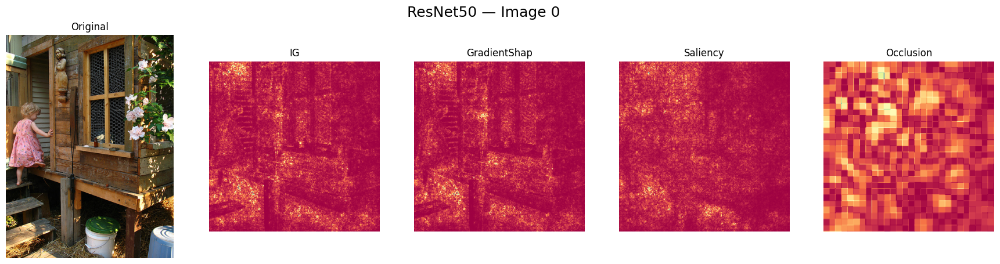


=== Top 10 Closest Captions to Image 0 ===

Rank 1 — Similarity 0.7002
Image: 506367606_7cca2bba9b.jpg


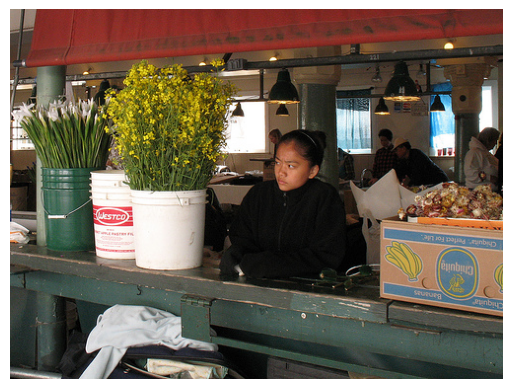

Caption: The girl is sitting at the counter between the bucket of flowers and the cardboard boxes .

Rank 2 — Similarity 0.6932
Image: 3729525173_7f984ed776.jpg


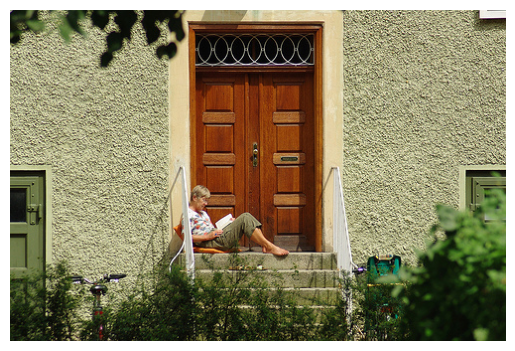

Caption: A woman sits and reads in the stoop of a wooden door .

Rank 3 — Similarity 0.6891
Image: 2624457062_89efc497a8.jpg


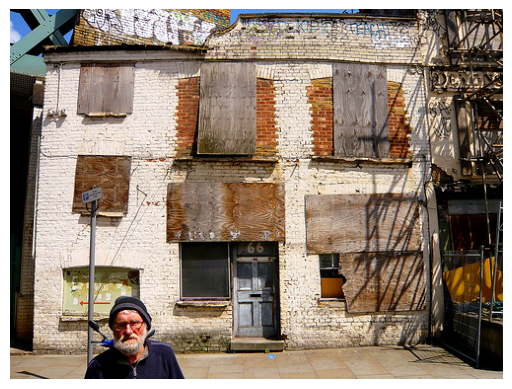

Caption: An older man stands outside a old boarded up building .

Rank 4 — Similarity 0.6882
Image: 3109268897_d43797fc6a.jpg


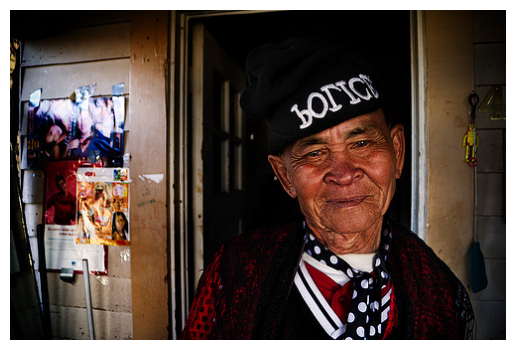

Caption: An old man stands in front of a doorway .

Rank 5 — Similarity 0.6878
Image: 3636632926_09f39f2629.jpg


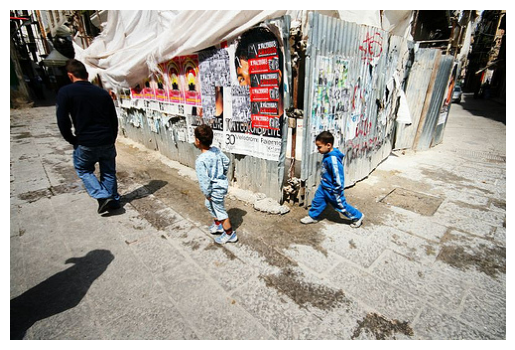

Caption: A man and two little boys walk around the outside of what appears to be some kind of store .

Rank 6 — Similarity 0.6870
Image: 343662720_39e4067cd1.jpg


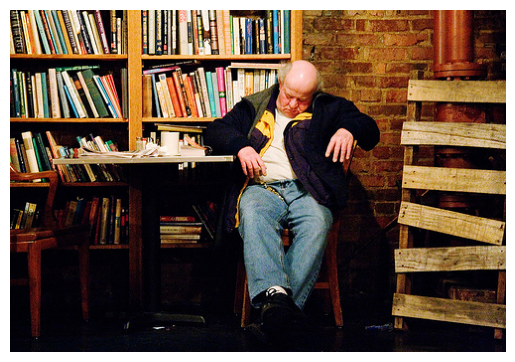

Caption: An old man is sleeping at a table in front of a book shelf .

Rank 7 — Similarity 0.6862
Image: 3025549604_38b86198f5.jpg


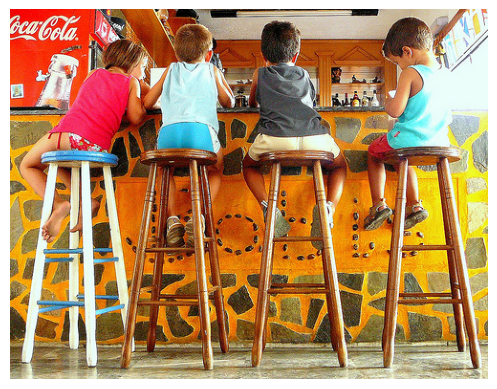

Caption: Four young children sitting on large bar stools next to a counter .

Rank 8 — Similarity 0.6854
Image: 195084264_72fb347b0f.jpg


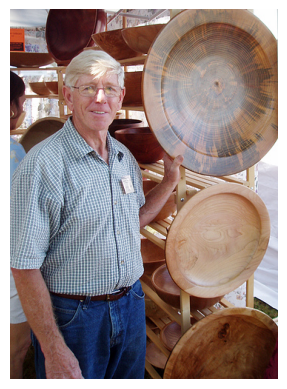

Caption: An older man is standing next to a display of wooden trays .

Rank 9 — Similarity 0.6825
Image: 2624457062_89efc497a8.jpg


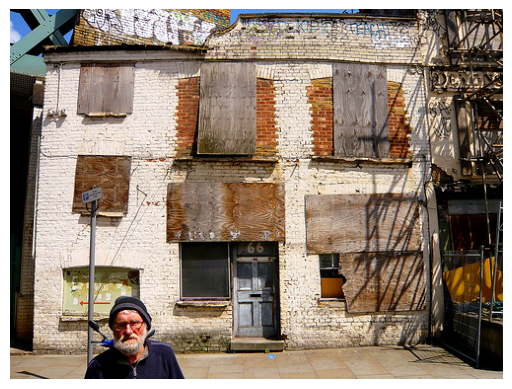

Caption: An old man stands in front of a rundown building .

Rank 10 — Similarity 0.6795
Image: 2245348304_08bc5642f1.jpg


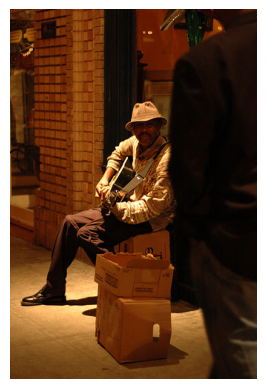

Caption: A man sits ourdoors next to cardboard boxes and plays an instrument .


In [26]:
k = 0
labels_proj, km_proj = cluster_embeddings(Xv_proj, n_clusters=20)

#show_cluster(k, labels_proj, IMAGE_PATHS)
#show_cluster_neighbors(k, labels_proj, Xv_proj, IMAGE_PATHS, df)
#show_cluster_neighbors_representatives(k, labels_proj, Xv_proj, IMAGE_PATHS, df)

show_attributions(VISION, 0, mode="unimodal")
top_k_closest_captions(0, Xv_proj, Xt_proj, df)


In [55]:
from transformers import AutoTokenizer, AutoModel

tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
text_model = AutoModel.from_pretrained("bert-base-uncased")

explain_cross_alignment(
    image_idx=0,
    Xv_proj=Xv_proj,
    Xt_proj=Xt_proj,
    df_text=df,
    model_name=VISION,
    tokenizer=tokenizer,
    text_model=text_model
)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] BertModel LOAD REPORT from: bert-base-uncased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


TypeError: cosine_similarity(): argument 'x1' (position 1) must be Tensor, not numpy.ndarray

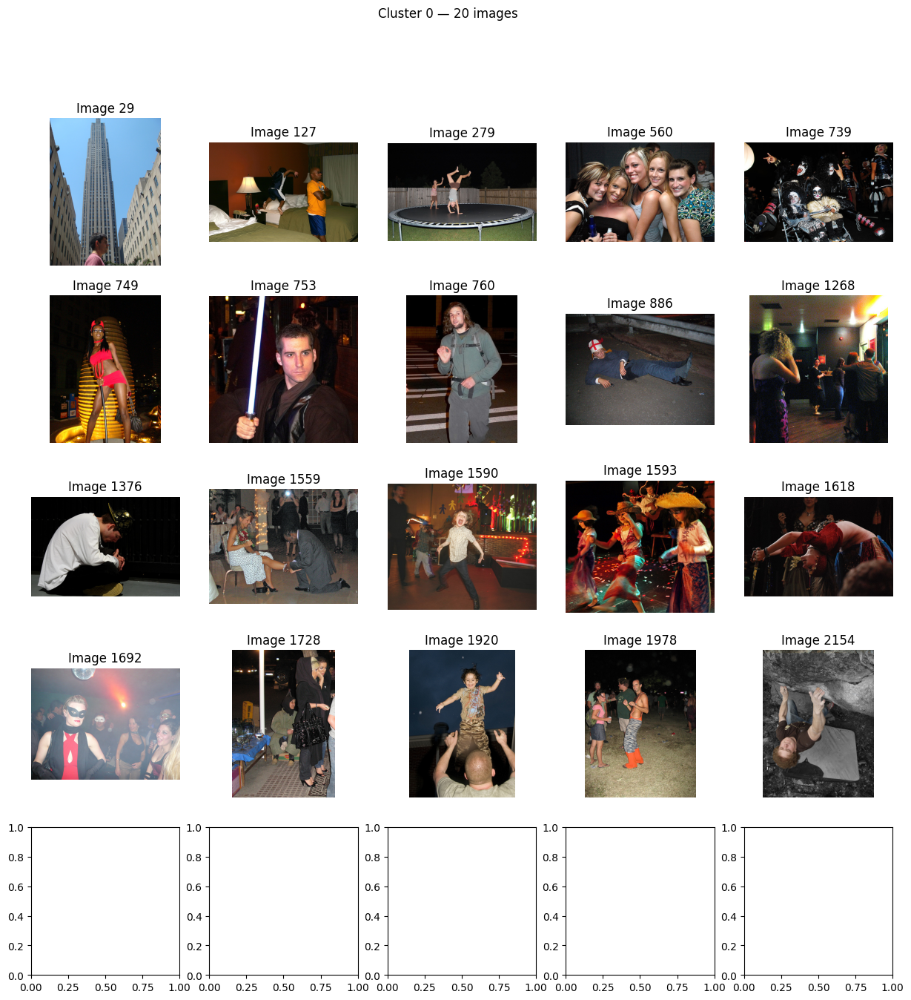

Closest clusters to cluster 0 : [ 8 16  6]


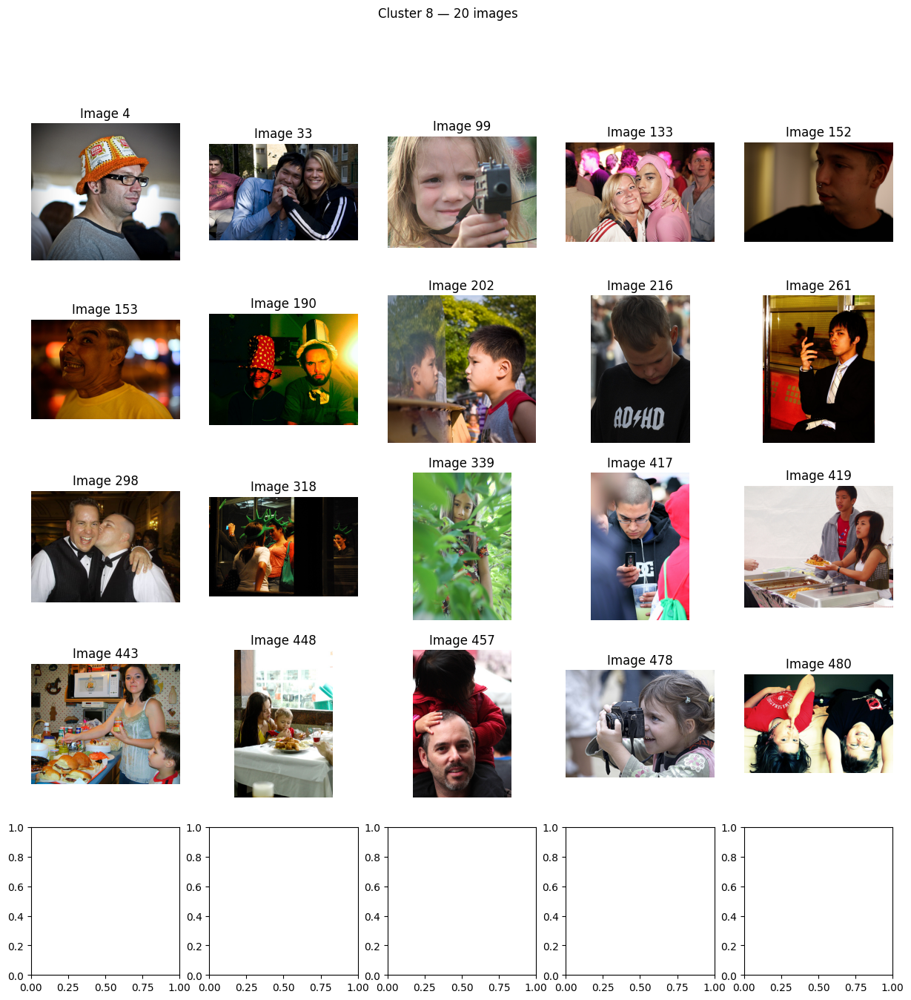

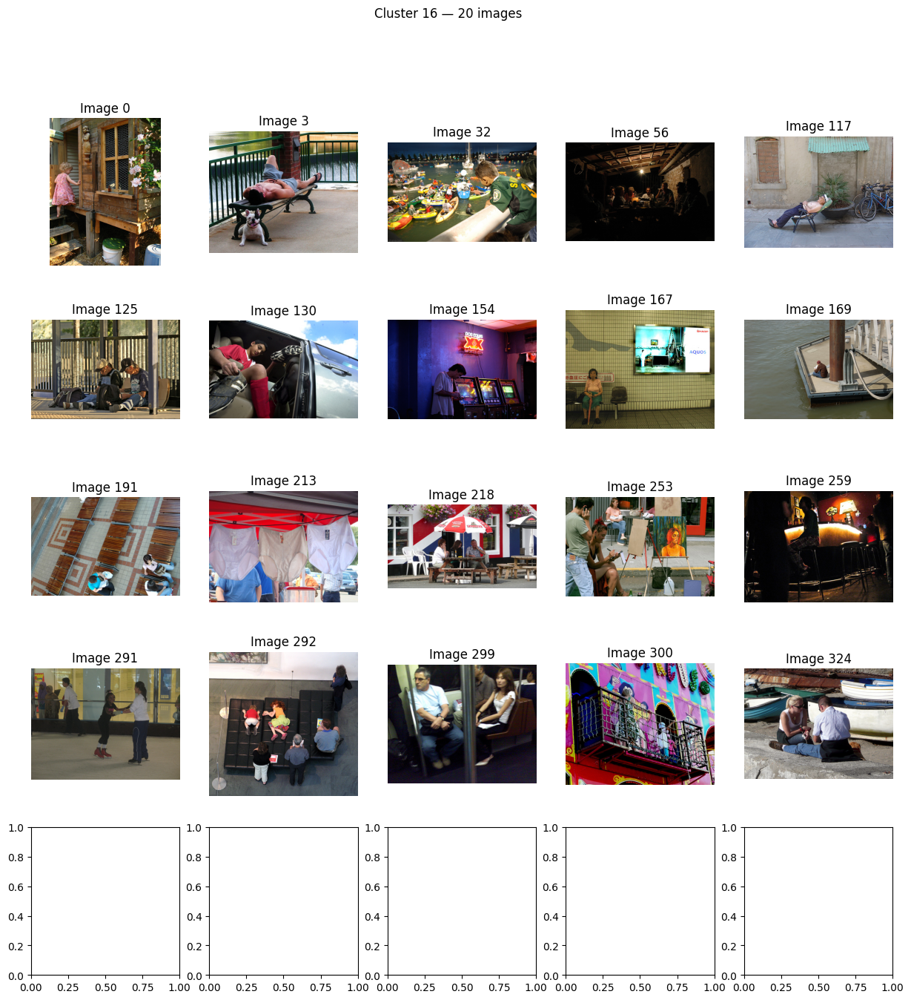

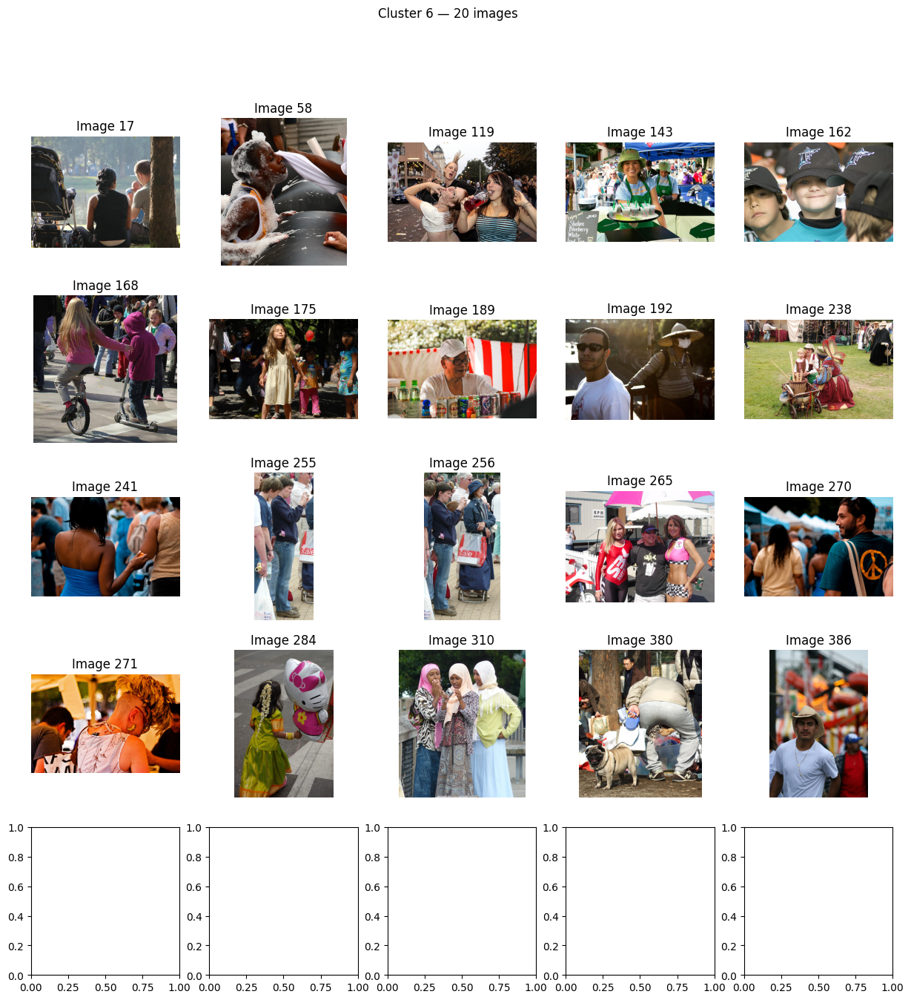

Furthest clusters to cluster 0 : [ 4  5 10]


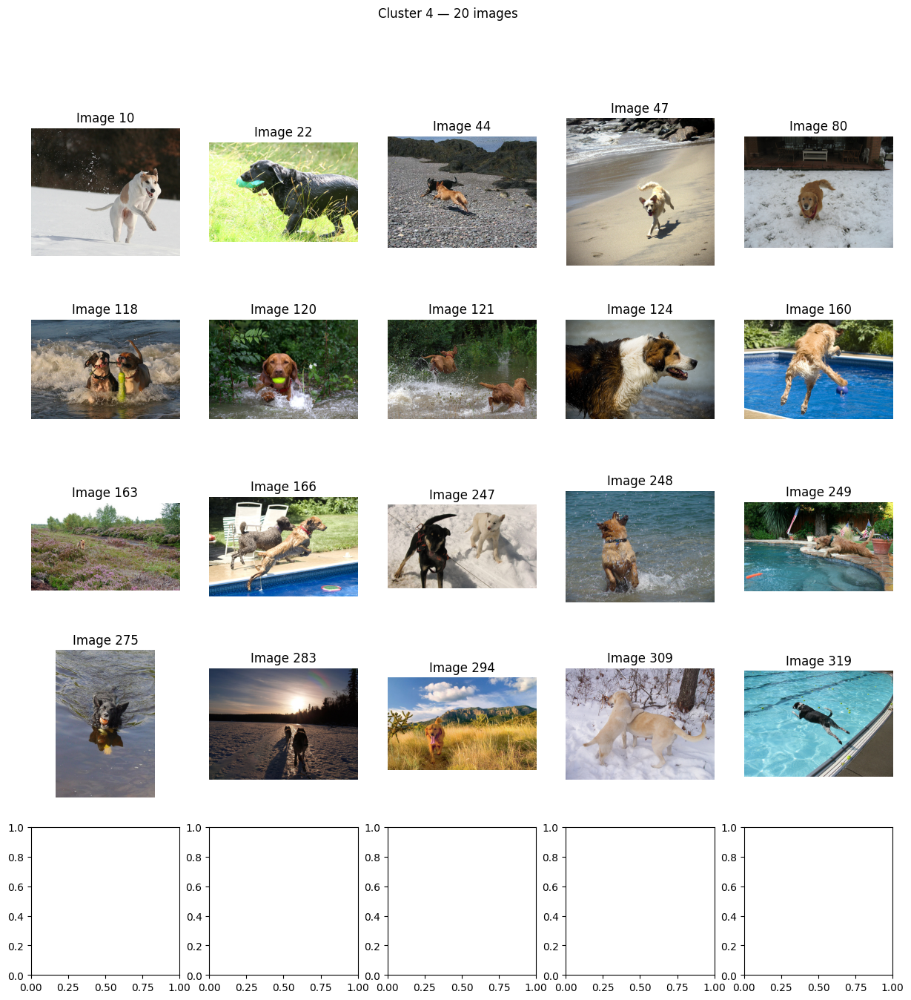

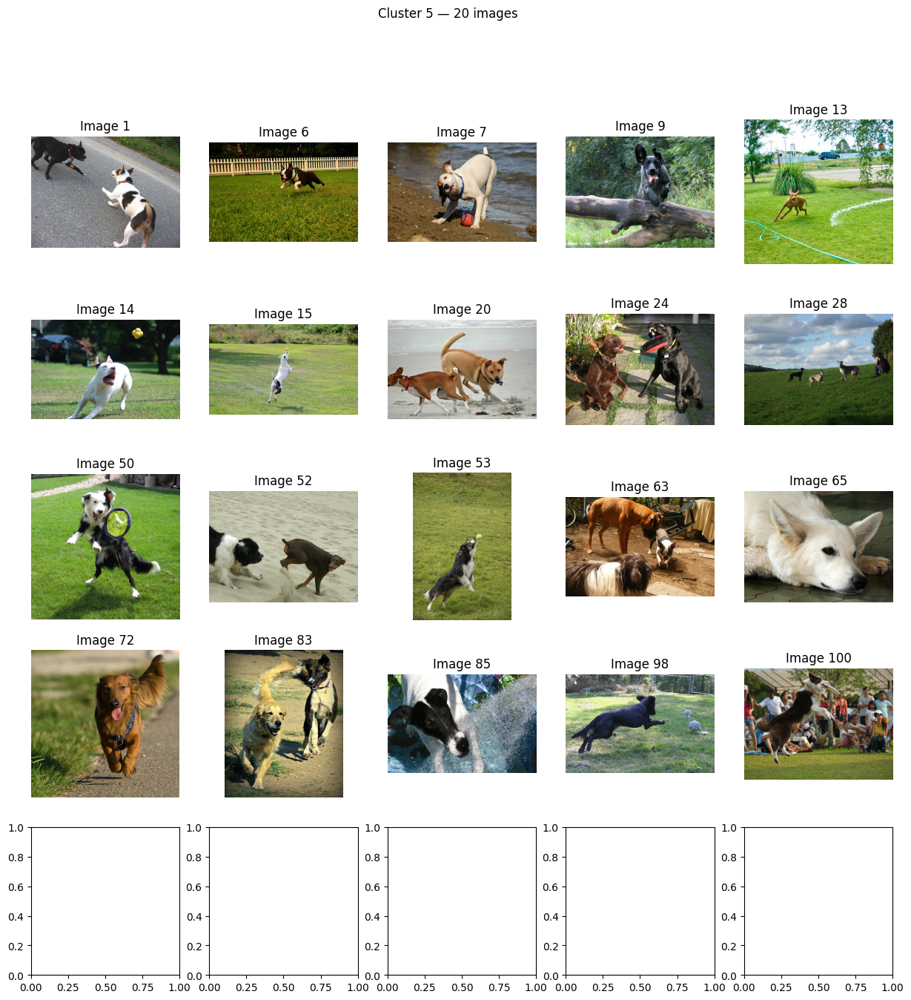

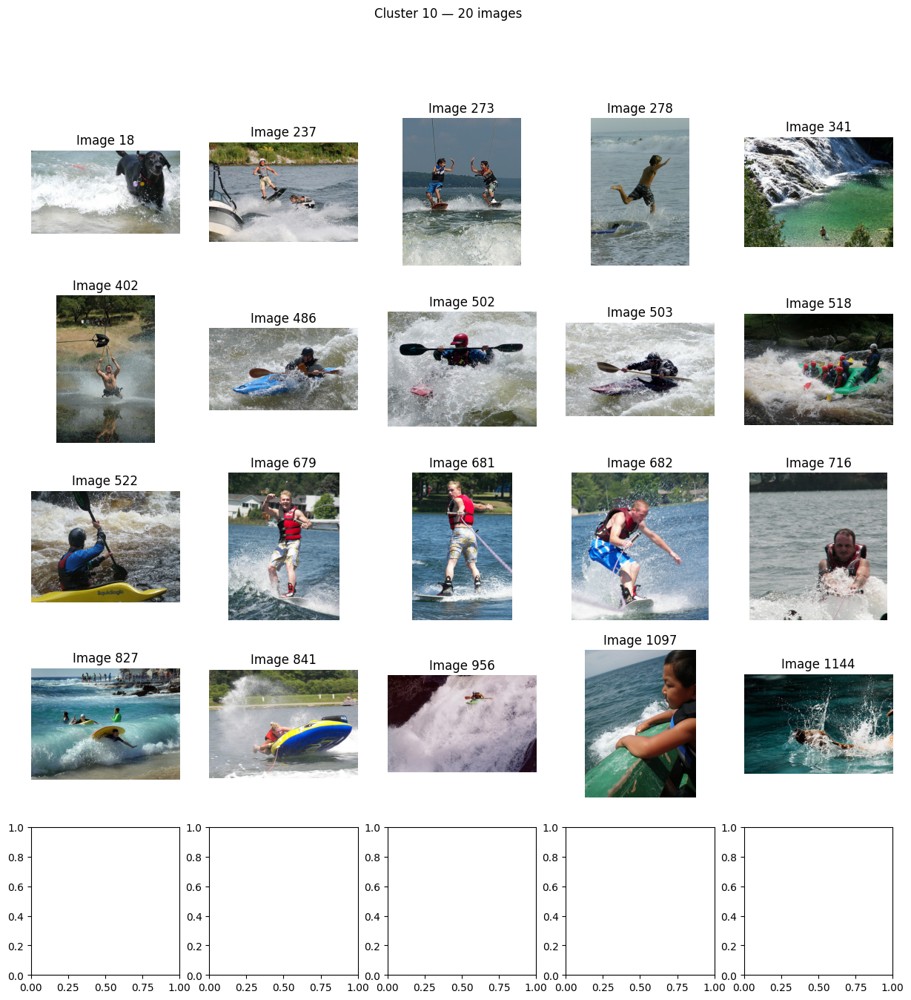

In [24]:
# visualize cluster k
k = 0
labels_proj, km_proj = cluster_embeddings(Xv_proj, n_clusters=20)
show_cluster(k, labels_proj, IMAGE_PATHS)

# closest and furthestclusters
centroids = cluster_centroids(Xv_proj, labels_proj)
dists = cosine_similarity(centroids)

closest = np.argsort(-dists[k])[1:4]   # top 3 closest
furthest = np.argsort(dists[k])[:3]    # top 3 furthest

print("Closest clusters to cluster", k, ":", closest)
for c in closest:
    show_cluster(c, labels_proj, IMAGE_PATHS)

print("Furthest clusters to cluster", k, ":", furthest)
for c in furthest:
    show_cluster(c, labels_proj, IMAGE_PATHS)
